In [203]:
# FOXSI IV - Optical Alignment:
#            Reads PNG Files of Laser Photos for Alignment
# ----------------------------
# 07/18/2023
# Orlando Romeo
#############################################################
%load_ext autoreload
%autoreload 2
# Import Third-party libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import ipywidgets as wdg
import matplotlib.pyplot as plt
import opalfoxsi
# Change for notebook backend
%matplotlib notebook

In [204]:
# Section 0: Initialize Parameters
#############################################################
pos            = 6
run            = 2
bf             = 2 # Brightness Factor checking projection
dirf           = "Images_07-17-23/"
file           = "POS"+str(pos)+"_RUN"+str(run) # Original file name
proj_flg       = 1            # If set to 1, will perform projection check on original image
newfile        = 'FOXSI_'+file+'_projected'
dirnfile       = dirf+"PROJ_Images/"
filetype       = '.png'
nfile_flg      = os.path.exists(dirnfile+newfile+filetype) # Check if newfile exists

In [205]:
opalfoxsi.readimage(dirnfile+newfile+filetype)

array([[[35, 73, 86],
        [35, 72, 86],
        [35, 73, 86],
        ...,
        [31, 69, 82],
        [31, 70, 83],
        [32, 71, 84]],

       [[36, 74, 87],
        [35, 72, 85],
        [35, 73, 86],
        ...,
        [31, 70, 82],
        [31, 71, 83],
        [31, 70, 83]],

       [[33, 70, 83],
        [33, 70, 82],
        [34, 72, 84],
        ...,
        [32, 72, 83],
        [33, 72, 84],
        [31, 70, 82]],

       ...,

       [[37, 70, 77],
        [35, 67, 74],
        [33, 64, 70],
        ...,
        [30, 62, 66],
        [28, 62, 67],
        [28, 62, 69]],

       [[36, 68, 77],
        [35, 67, 75],
        [36, 68, 76],
        ...,
        [30, 63, 70],
        [30, 64, 71],
        [30, 64, 72]],

       [[34, 66, 75],
        [34, 66, 74],
        [35, 68, 76],
        ...,
        [29, 62, 70],
        [30, 64, 72],
        [31, 66, 75]]], dtype=uint8)

In [198]:
# Section 1: Read File
#############################################################
if proj_flg or not nfile_flg:
    # Read Image File
    image_original = cv2.imread(dirf+file+filetype)
else:
    image_final = cv2.imread(dirnfile+newfile+filetype)
#############################################################

<IPython.core.display.Javascript object>


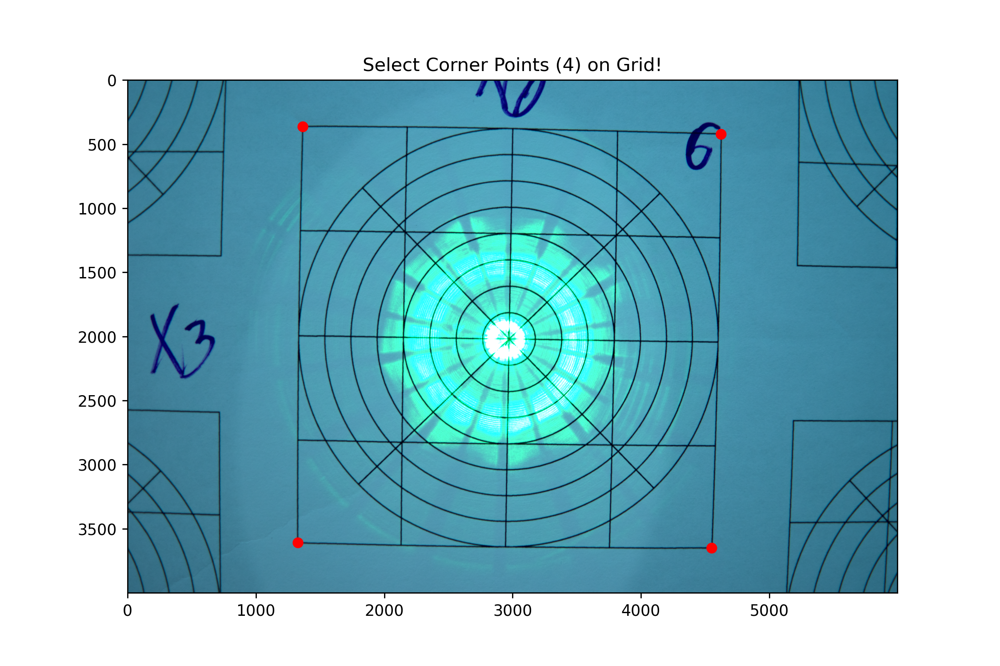

In [199]:
# Section 2: User Input for Grid Corners
#############################################################
if proj_flg or not nfile_flg:
    # Prepare Image to Check Projection from Photo Capture
    image        = image_original.copy()
    sz           = np.shape(image)
    # Remove alpha values (Only need RGB Values)
    image        = image[:,:,0:3]
    # Increase brightness to align grid due to projection issues
    image_bright = cv2.convertScaleAbs(image, 1, bf)
    #############################################################
    # Plot New Brighter Image
    # Create a scatter plot using ipywidgets
    def create_interactive_plot(image):
        fig, ax = plt.subplots(figsize=(9,6))
        ax.imshow(image)
        ax.set_title("Select Corner Points (4) on Grid!")
        ax.axis('on')
        scatter = ax.scatter([], [], marker='o', color='red')
        # List to store selected points
        global selected_points
        selected_points = []
        def on_click(event):
            if event.xdata is not None and event.ydata is not None:
                if ax.get_navigate_mode() == 'ZOOM':
                    return  # Ignore the click if zooming is active
                x = (event.xdata)
                y = (event.ydata)
                if len(selected_points) > 3:
                    print('TOO MANY POINTS SELECTED...RETURNING!')
                    fig.canvas.mpl_disconnect(cid)
                    return  # Ignore if 4 points are already selected
                selected_points.append((x, y))  # Append the selected point to the list
                scatter.set_offsets(selected_points)  # Update the scatter plot
                print(f"Selected point: x={x}, y={y}")
        # Connect the mouse click event to the function
        cid = fig.canvas.mpl_connect('button_press_event', on_click)
        return fig
    # Display the interactive plot
    plot = create_interactive_plot(image_bright)

<IPython.core.display.Javascript object>


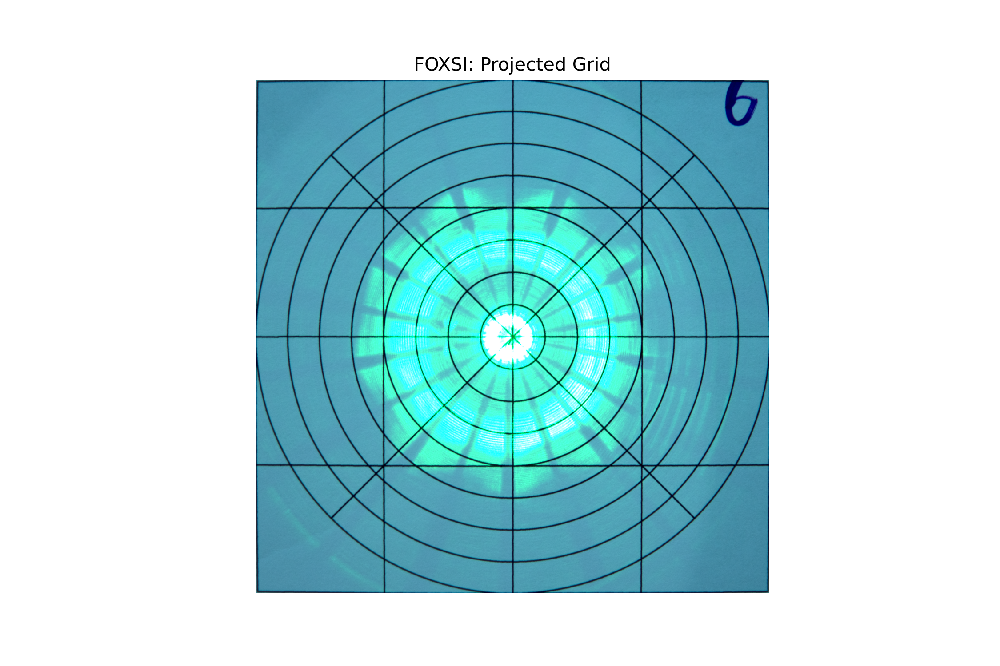

In [200]:
# Section 3: Determine Projection for Straightening Image
#############################################################
if (proj_flg or not nfile_flg) and (len(selected_points) == 4):
    # Determine relative positions of points
    pts = (selected_points)
    # Convert points to a NumPy array
    points = np.array(pts)
    # Find the center of the rectangle
    center = np.mean(points, axis=0)
    # Calculate the angles of each point with respect to the center
    angles = np.arctan2(points[:, 1] - center[1], points[:, 0] - center[0])
    # Sort the points based on the angles in ascending order (topleft, topright, bottomright, bottom_left)
    sourcePoints = points[np.argsort(angles)]
    #############################################################
    # Draw square from reference point
    square_x = np.min(sourcePoints[2::1,1])-sourcePoints[0,1]
    square_y = square_x
    # Determine target points from square
    targetPoints = np.empty((4,2))
    # Set top left point
    targetPoints[0,:] = sourcePoints[0,:]
    # Set top right point
    targetPoints[1,:] = sourcePoints[0,:] + [square_x,0.0]
    # Set bottom right point
    targetPoints[2,:] = sourcePoints[0,:] + [square_x,square_y]
    # Set bottom left point
    targetPoints[3,:] = sourcePoints[0,:] + [0.0,square_y]
    #############################################################
    # Prepare array in which the image is placed
    array = np.empty((int(sz[1]*np.sqrt(2)), int(sz[0]*np.sqrt(2)), 3), dtype='uint8')
    # Calculate affine matrix and transform image
    M, mask = cv2.findHomography(np.float32(sourcePoints), np.float32(targetPoints))
    dst     = cv2.warpPerspective(image, M,array.shape[:2]) 
    # Crop Image
    bw = 10 # Border Width
    image_final = dst[int(targetPoints[0,1]-bw):int(targetPoints[2,1]+bw),
                      int(targetPoints[0,0]-bw):int(targetPoints[1,0]+bw)]
    fig, ax = plt.subplots(figsize=(9,6))
    ax.imshow(cv2.convertScaleAbs(image_final, 1, bf))
    ax.set_title("FOXSI: Projected Grid")
    ax.axis('off')
    plt.show()
    image_array = np.array(image_final, dtype=np.uint8)
    # Save the image as a PNG file using cv2.imwrite()
    file2 = cv2.imwrite(dirnfile+newfile+filetype, image_array)

In [140]:
np.shape(points)

(0,)

In [6]:
# Convert BGR image to RGB format
rgb_image = cv2.cvtColor(image_final, cv2.COLOR_BGR2RGB)
# Calculate the brightness (luminance) from RGB values
brightness = np.mean(rgb_image, axis=-1)

<IPython.core.display.Javascript object>


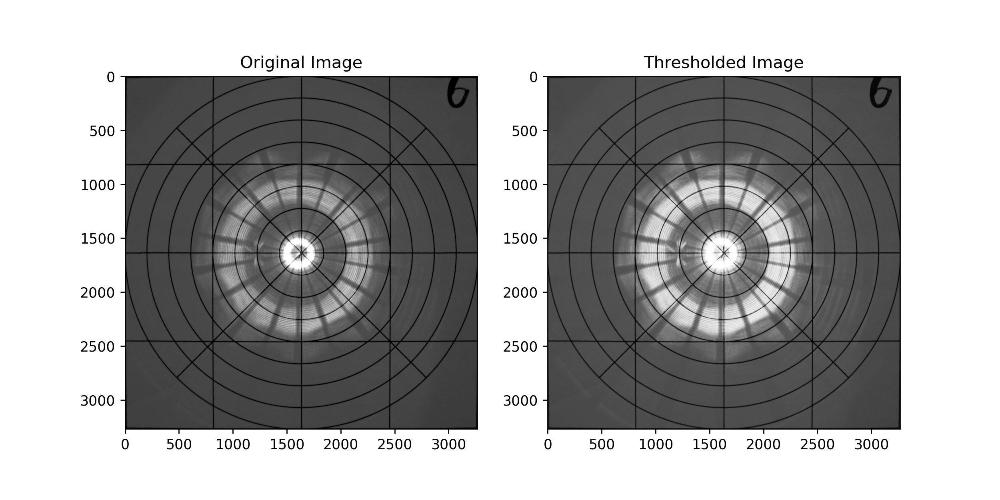

(-0.5, 3266.5, 3266.5, -0.5)

In [202]:
# Convert BGR image to RGB format
rgb_image = cv2.cvtColor(image_final, cv2.COLOR_BGR2RGB)
brightness = np.mean(rgb_image, axis=-1)

# Filter brightness
brightness[np.where(brightness < 22)] = 0

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(brightness, cmap='gray')
plt.title("Original Image")
plt.axis('on')

plt.subplot(1, 2, 2)
plt.imshow((0.2126*rgb_image[:,:,0] + 0.7152*rgb_image[:,:,1] + 0.0722*rgb_image[:,:,2]), cmap='gray')
plt.title("Thresholded Image")
plt.axis('on')

<IPython.core.display.Javascript object>


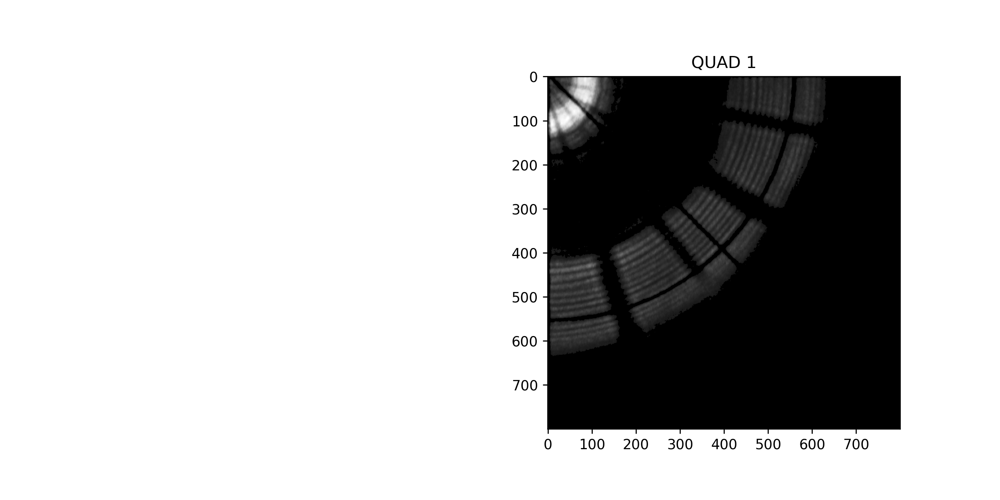

<IPython.core.display.Javascript object>


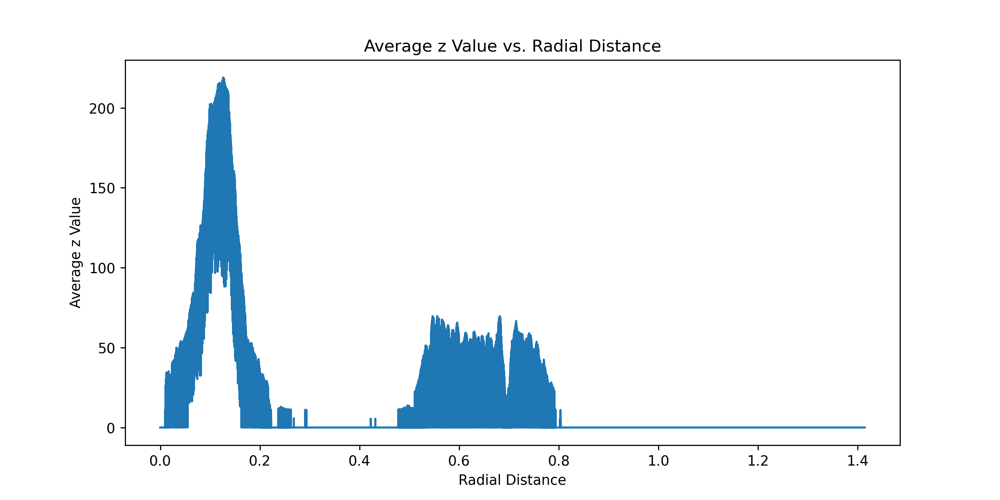

In [21]:
from scipy.stats import mode

outerx = 800 #int(b_sz[0]/2)
outery = 800 #int(b_sz[0]/2)
# Find Radial Profiles for each quadrant of brightness
b_sz = np.shape(brightness)
quad1 = brightness[:int(b_sz[0]/2),int(b_sz[0]/2):]
q1 = np.rot90(np.transpose(quad1))
q1 = q1[0:outerx,0:outery]
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 2)
plt.imshow(q1, cmap='gray')
plt.title("QUAD 1")
plt.axis('on')

# Assuming you have the x, y, and z arrays for your grid
x = np.linspace(0, 1, num=outerx)
y = np.linspace(0, 1, num=outery)
xx, yy = np.meshgrid(x, y)
# Calculate the radial distance from the origin (0, 0) for each point
radial_distance = np.sqrt(xx**2 + yy**2)
theta_angle     = np.arctan2(yy,xx)
# Convert theta to range 0 to 2*pi for histogram
theta_angle     = theta_angle % (2 * np.pi)
# Find the unique radial distances and their corresponding indices
unique_radial_distances, indices = np.unique(radial_distance, return_inverse=True)
# Calculate the average z values for each unique radial distance
average_z_values = np.bincount(indices, weights=q1.ravel()) / np.bincount(indices)

# Plot the average z values against radial distance
plt.figure(figsize=(10, 5))
plt.plot(unique_radial_distances, average_z_values)
plt.xlabel('Radial Distance')
plt.ylabel('Average z Value')
plt.title('Average z Value vs. Radial Distance')
plt.show()


<IPython.core.display.Javascript object>


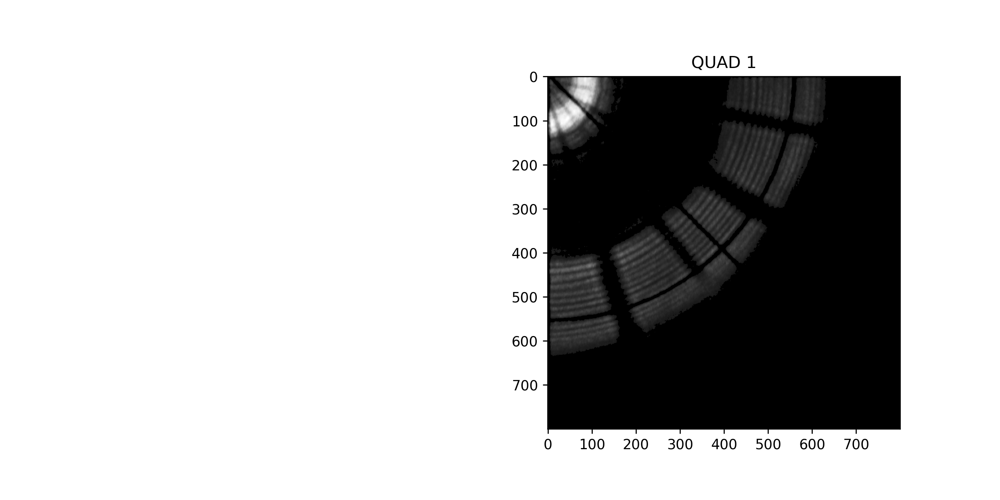

<IPython.core.display.Javascript object>


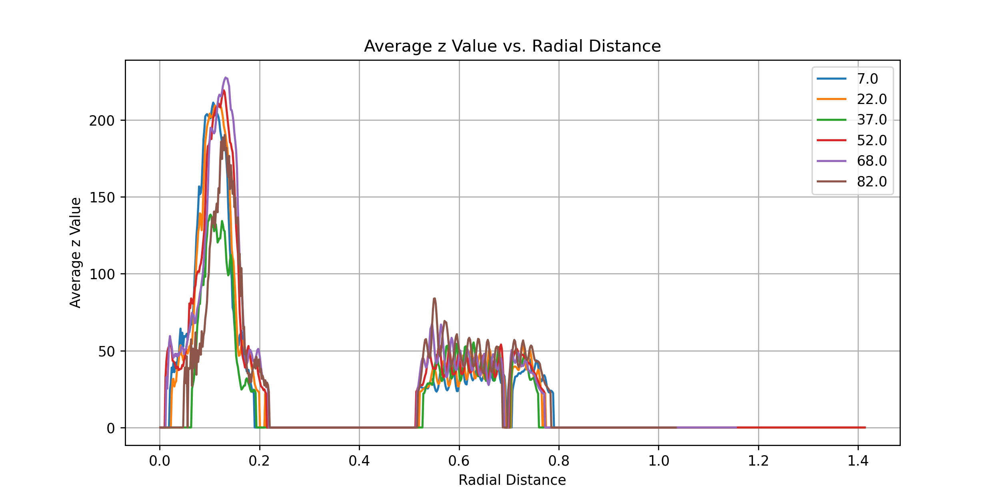

In [80]:
from scipy.stats import binned_statistic_2d
from matplotlib import cm

outerx = 800 #int(b_sz[0]/2)
outery = 800 #int(b_sz[0]/2)
# Find Radial Profiles for each quadrant of brightness
b_sz = np.shape(brightness)
quad1 = brightness[:int(b_sz[0]/2),int(b_sz[0]/2):]
q1 = np.rot90(np.transpose(quad1))
q1 = q1[0:outerx,0:outery]
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 2)
plt.imshow(q1, cmap='gray')
plt.title("QUAD 1")
plt.axis('on')

# Assuming you have the x, y, and z arrays for your grid
x = np.linspace(0, 1, num=outerx)
y = np.linspace(0, 1, num=outery)
xx, yy = np.meshgrid(x, y)
# Calculate the radial distance from the origin (0, 0) for each point
r = np.sqrt(xx**2 + yy**2)
theta     = np.arctan2(yy,xx)
# Convert theta to range 0 to 2*pi for histogram
theta     = theta % (2 * np.pi)
# Create bins
rbin = np.linspace(0, np.sqrt(2), num=outerx)
tbin = np.linspace(0, np.pi/2.0, num=7)
rmid = (rbin[:-1] + rbin[1:]) / 2.0
tmid = (tbin[:-1] + tbin[1:]) / 2.0

z = binned_statistic_2d(r.ravel(),theta.ravel(), q1.ravel(), statistic='median', bins=[rbin,tbin])
z2 = z.statistic[:,:]
z2[np.where(z2 < 20)] = 0
# Plot the average z values against radial distance
plt.figure(figsize=(10, 5))


# Step 3: Plot the curves with the desired colormap
cmap = cm.get_cmap('viridis')  # Replace 'viridis' with any other Matplotlib colormap of your choice

# Use NumPy broadcasting to plot all curves at once
plt.plot(np.tile(rmid, (len(tmid), 1)).T, z2[:, :] , color=cmap(np.linspace(0, 1, len(tmid)))  )



#plt.plot(rmid, z2)#np.mean(z2,axis=1))
plt.xlabel('Radial Distance')
plt.ylabel('Average z Value')
plt.title('Average z Value vs. Radial Distance')
plt.grid()
plt.legend(np.round(180.*tmid/(np.pi)))
plt.show()

In [82]:
cmap(np.linspace(0, 1, len(tmid))) 

array([[0.267004, 0.004874, 0.329415, 1.      ],
       [0.253935, 0.265254, 0.529983, 1.      ],
       [0.163625, 0.471133, 0.558148, 1.      ],
       [0.134692, 0.658636, 0.517649, 1.      ],
       [0.477504, 0.821444, 0.318195, 1.      ],
       [0.993248, 0.906157, 0.143936, 1.      ]])

In [ ]:
from scipy.stats import mode

# Find Radial Profiles for each quadrant of brightness
b_sz = np.shape(brightness)
quad1 = brightness[:int(b_sz[0]/2),int(b_sz[0]/2):]
q1 = np.rot90(np.transpose(quad1))

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 2)
plt.imshow(q1, cmap='gray')
plt.title("QUAD 1")
plt.axis('on')

# Assuming you have the x, y, and z arrays for your grid
x = np.linspace(0, int(b_sz[0]/2), num=int(b_sz[0]/2))
y = np.linspace(0, int(b_sz[0]/2), num=int(b_sz[0]/2))
xx, yy = np.meshgrid(x, y)
# Calculate the radial distance from the origin (0, 0) for each point
radial_distance = np.sqrt(xx**2 + yy**2)
# Find the unique radial distances and their corresponding indices
unique_radial_distances, indices = np.unique(radial_distance, return_inverse=True)
z_flat = q1.ravel()
# Calculate the mode z values for each unique radial distance using np.bincount()
counts = np.bincount(indices)
max_indices = np.maximum.reduceat(z_flat, np.append(0, np.cumsum(counts)[:-1]))

# Retrieve the mode value for each unique radial distance
mode_z_values = np.asarray([mode(z_flat[indices == i])[0][0] for i in range(len(counts))])

        

# Plot the average z values against radial distance
plt.figure(figsize=(10, 5))
plt.plot(unique_radial_distances, mode_z_values)
plt.xlabel('Radial Distance')
plt.ylabel('Mode z Value')
plt.title('Mode z Value vs. Radial Distance')
plt.show()


In [ ]:
np.shape(radial_distance)

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(brightness[1500,1500:])
plt.show()

In [ ]:
np.shape(brightness)

In [ ]:
2964/2.

<IPython.core.display.Javascript object>


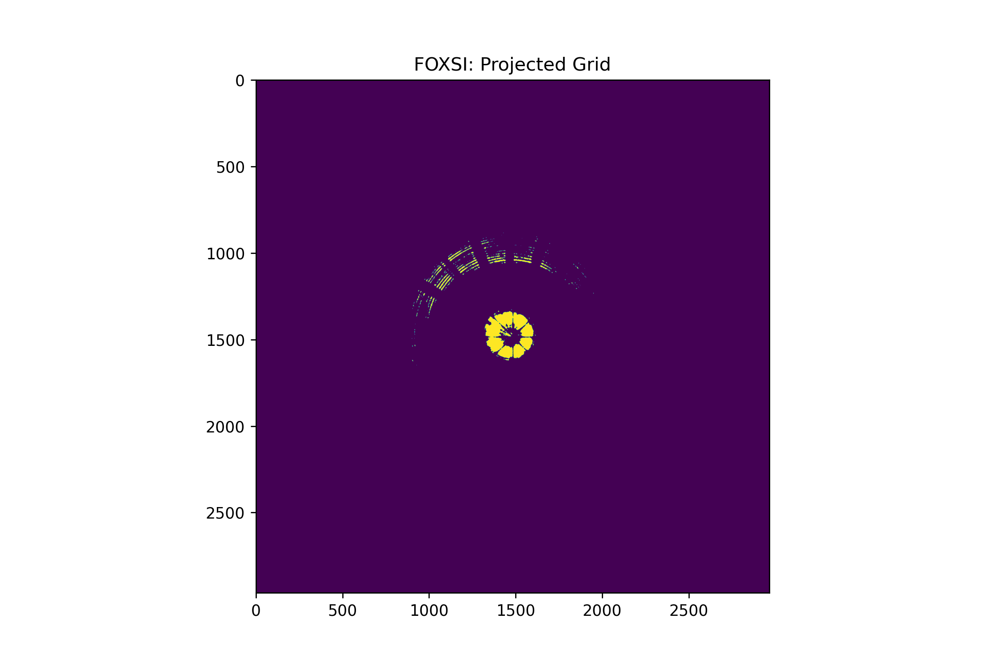

<IPython.core.display.Javascript object>


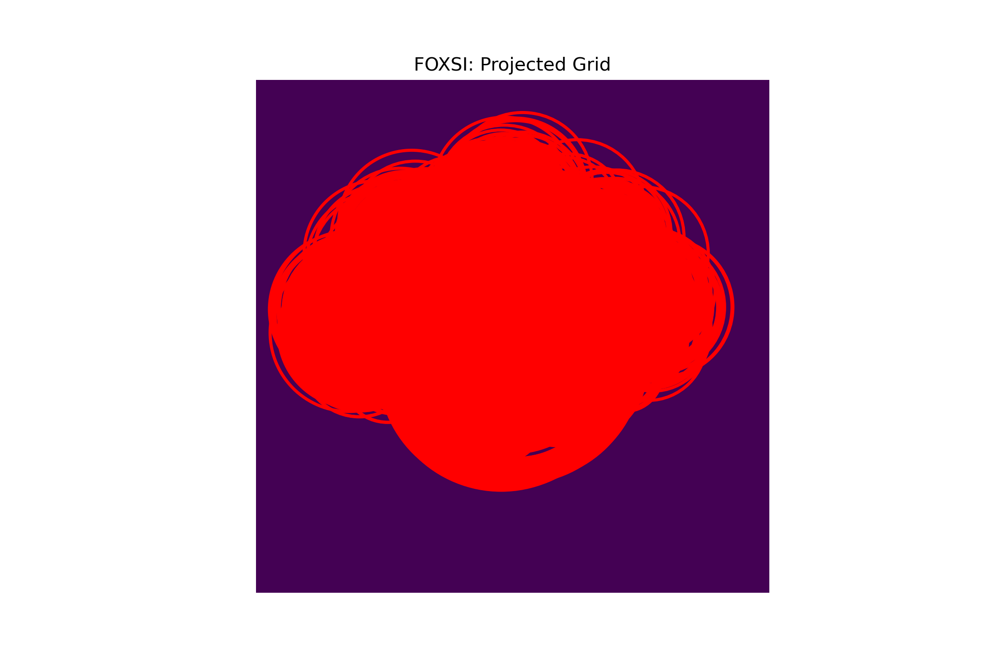

Ring Size: 1106 pixels
Ring Size: 1106 pixels
Ring Size: 1126 pixels
Ring Size: 1108 pixels
Ring Size: 1074 pixels
Ring Size: 1114 pixels
Ring Size: 1116 pixels
Ring Size: 1070 pixels
Ring Size: 1116 pixels
Ring Size: 1114 pixels
Ring Size: 1090 pixels
Ring Size: 1108 pixels
Ring Size: 1112 pixels
Ring Size: 1116 pixels
Ring Size: 1102 pixels
Ring Size: 1116 pixels
Ring Size: 1092 pixels
Ring Size: 1076 pixels
Ring Size: 1106 pixels
Ring Size: 1120 pixels
Ring Size: 1098 pixels
Ring Size: 1122 pixels
Ring Size: 1122 pixels
Ring Size: 1080 pixels
Ring Size: 1078 pixels
Ring Size: 1132 pixels
Ring Size: 1070 pixels
Ring Size: 1090 pixels
Ring Size: 1068 pixels
Ring Size: 1116 pixels
Ring Size: 1082 pixels
Ring Size: 1056 pixels
Ring Size: 1076 pixels
Ring Size: 1062 pixels
Ring Size: 1126 pixels
Ring Size: 1058 pixels
Ring Size: 1110 pixels
Ring Size: 1114 pixels
Ring Size: 1100 pixels
Ring Size: 1076 pixels
Ring Size: 1076 pixels
Ring Size: 1062 pixels
Ring Size: 1080 pixels
Ring Size: 

Ring Size: 1300 pixels
Ring Size: 1276 pixels
Ring Size: 1274 pixels
Ring Size: 1258 pixels
Ring Size: 1256 pixels
Ring Size: 1252 pixels
Ring Size: 1236 pixels
Ring Size: 1222 pixels
Ring Size: 1222 pixels
Ring Size: 1220 pixels
Ring Size: 1218 pixels
Ring Size: 1216 pixels
Ring Size: 1214 pixels
Ring Size: 1212 pixels
Ring Size: 1202 pixels
Ring Size: 1196 pixels
Ring Size: 1190 pixels
Ring Size: 1288 pixels
Ring Size: 1276 pixels
Ring Size: 1260 pixels
Ring Size: 1254 pixels
Ring Size: 1236 pixels
Ring Size: 1228 pixels
Ring Size: 1224 pixels
Ring Size: 1222 pixels
Ring Size: 1214 pixels
Ring Size: 1202 pixels
Ring Size: 1188 pixels
Ring Size: 1174 pixels
Ring Size: 978 pixels
Ring Size: 900 pixels
Ring Size: 1296 pixels
Ring Size: 1286 pixels
Ring Size: 1284 pixels
Ring Size: 1276 pixels
Ring Size: 1272 pixels
Ring Size: 1270 pixels
Ring Size: 1270 pixels
Ring Size: 1258 pixels
Ring Size: 1256 pixels
Ring Size: 1252 pixels
Ring Size: 1248 pixels
Ring Size: 1240 pixels
Ring Size: 12

Ring Size: 850 pixels
Ring Size: 848 pixels
Ring Size: 842 pixels
Ring Size: 760 pixels
Ring Size: 740 pixels
Ring Size: 736 pixels
Ring Size: 722 pixels
Ring Size: 684 pixels
Ring Size: 682 pixels
Ring Size: 964 pixels
Ring Size: 962 pixels
Ring Size: 958 pixels
Ring Size: 954 pixels
Ring Size: 944 pixels
Ring Size: 938 pixels
Ring Size: 934 pixels
Ring Size: 912 pixels
Ring Size: 894 pixels
Ring Size: 890 pixels
Ring Size: 890 pixels
Ring Size: 886 pixels
Ring Size: 884 pixels
Ring Size: 880 pixels
Ring Size: 880 pixels
Ring Size: 876 pixels
Ring Size: 870 pixels
Ring Size: 860 pixels
Ring Size: 848 pixels
Ring Size: 748 pixels
Ring Size: 740 pixels
Ring Size: 724 pixels
Ring Size: 700 pixels
Ring Size: 1238 pixels
Ring Size: 948 pixels
Ring Size: 944 pixels
Ring Size: 898 pixels
Ring Size: 896 pixels
Ring Size: 892 pixels
Ring Size: 878 pixels
Ring Size: 876 pixels
Ring Size: 872 pixels
Ring Size: 816 pixels
Ring Size: 740 pixels
Ring Size: 740 pixels
Ring Size: 736 pixels
Ring Size

Ring Size: 650 pixels
Ring Size: 634 pixels
Ring Size: 624 pixels
Ring Size: 616 pixels
Ring Size: 588 pixels
Ring Size: 584 pixels
Ring Size: 928 pixels
Ring Size: 920 pixels
Ring Size: 900 pixels
Ring Size: 890 pixels
Ring Size: 888 pixels
Ring Size: 880 pixels
Ring Size: 872 pixels
Ring Size: 870 pixels
Ring Size: 868 pixels
Ring Size: 858 pixels
Ring Size: 856 pixels
Ring Size: 854 pixels
Ring Size: 852 pixels
Ring Size: 848 pixels
Ring Size: 842 pixels
Ring Size: 836 pixels
Ring Size: 836 pixels
Ring Size: 834 pixels
Ring Size: 816 pixels
Ring Size: 812 pixels
Ring Size: 808 pixels
Ring Size: 806 pixels
Ring Size: 746 pixels
Ring Size: 738 pixels
Ring Size: 734 pixels
Ring Size: 734 pixels
Ring Size: 732 pixels
Ring Size: 732 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 726 pixels
Ring Size: 718 pixels
Ring Size: 716 pixels
Ring Size: 716 pixels
Ring Size: 714 pixels
Ring Size: 710 pixels
Ring Size: 704 pixels
Ring Size: 702 pixels
Ring Size: 700 pixels
Ring Size:

Ring Size: 834 pixels
Ring Size: 832 pixels
Ring Size: 828 pixels
Ring Size: 822 pixels
Ring Size: 822 pixels
Ring Size: 818 pixels
Ring Size: 816 pixels
Ring Size: 816 pixels
Ring Size: 814 pixels
Ring Size: 812 pixels
Ring Size: 810 pixels
Ring Size: 806 pixels
Ring Size: 806 pixels
Ring Size: 796 pixels
Ring Size: 788 pixels
Ring Size: 772 pixels
Ring Size: 762 pixels
Ring Size: 760 pixels
Ring Size: 742 pixels
Ring Size: 736 pixels
Ring Size: 734 pixels
Ring Size: 734 pixels
Ring Size: 732 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 728 pixels
Ring Size: 722 pixels
Ring Size: 718 pixels
Ring Size: 718 pixels
Ring Size: 718 pixels
Ring Size: 716 pixels
Ring Size: 716 pixels
Ring Size: 716 pixels
Ring Size: 714 pixels
Ring Size: 714 pixels
Ring Size: 714 pixels
Ring Size: 712 pixels
Ring Size: 712 pixels
Ring Size: 710 pixels
Ring Size: 710 pixels
Ring Size: 710 pixels
Ring Size: 708 pixels
Ring Size: 708 pixels
Ring Size: 706 pixels
Ring Size: 706 pixels
Ring Size:

Ring Size: 646 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 632 pixels
Ring Size: 632 pixels
Ring Size: 632 pixels
Ring Size: 628 pixels
Ring Size: 628 pixels
Ring Size: 624 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 616 pixels
Ring Size: 614 pixels
Ring Size: 612 pixels
Ring Size: 608 pixels
Ring Size: 606 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 602 pixels
Ring Size: 588 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 558 pixels
Ring Size: 916 pixels
Ring Size: 888 pixels
Ring Size: 880 pixels
Ring Size: 862 pixels
Ring Size: 858 pixels
Ring Size: 856 pixels
Ring Size: 856 pixels
Ring Size: 852 pixels
Ring Size: 850 pixels
Ring Size: 848 pixels
Ring Size: 842 pixels
Ring Size: 842 pixels
Ring Size: 838 pixels
Ring Size: 834 pixels
Ring Size: 830 pixels
Ring Size: 828 pixels
Ring Size: 828 pixels
Ring Size: 826 pixels
Ring Size: 826 pixels
Ring Size:

Ring Size: 852 pixels
Ring Size: 852 pixels
Ring Size: 850 pixels
Ring Size: 844 pixels
Ring Size: 844 pixels
Ring Size: 842 pixels
Ring Size: 842 pixels
Ring Size: 842 pixels
Ring Size: 840 pixels
Ring Size: 834 pixels
Ring Size: 828 pixels
Ring Size: 824 pixels
Ring Size: 822 pixels
Ring Size: 820 pixels
Ring Size: 820 pixels
Ring Size: 818 pixels
Ring Size: 814 pixels
Ring Size: 810 pixels
Ring Size: 810 pixels
Ring Size: 792 pixels
Ring Size: 788 pixels
Ring Size: 778 pixels
Ring Size: 754 pixels
Ring Size: 738 pixels
Ring Size: 730 pixels
Ring Size: 728 pixels
Ring Size: 728 pixels
Ring Size: 726 pixels
Ring Size: 724 pixels
Ring Size: 724 pixels
Ring Size: 724 pixels
Ring Size: 722 pixels
Ring Size: 720 pixels
Ring Size: 718 pixels
Ring Size: 716 pixels
Ring Size: 712 pixels
Ring Size: 712 pixels
Ring Size: 710 pixels
Ring Size: 706 pixels
Ring Size: 706 pixels
Ring Size: 702 pixels
Ring Size: 702 pixels
Ring Size: 702 pixels
Ring Size: 700 pixels
Ring Size: 696 pixels
Ring Size:

Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 608 pixels
Ring Size: 606 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 584 pixels
Ring Size: 582 pixels
Ring Size: 576 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 538 pixels
Ring Size: 900 pixels
Ring Size: 892 pixels
Ring Size: 862 pixels
Ring Size: 854 pixels
Ring Size: 850 pixels
Ring Size: 848 pixels
Ring Size: 846 pixels
Ring Size: 844 pixels
Ring Size: 836 pixels
Ring Size: 828 pixels
Ring Size: 828 pixels
Ring Size: 826 pixels
Ring Size: 826 pixels
Ring Size: 822 pixels
Ring Size: 822 pixels
Ring Size: 820 pixels
Ring Size: 816 pixels
Ring Size: 810 pixels
Ring Size: 800 pixels
Ring Size: 798 pixels
Ring Size:

Ring Size: 694 pixels
Ring Size: 694 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 690 pixels
Ring Size: 690 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size:

Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 580 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 570 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 560 pixels
Ring Size: 556 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 920 pixels
Ring Size: 898 pixels
Ring Size: 898 pixels
Ring Size: 852 pixels
Ring Size: 846 pixels
Ring Size: 844 pixels
Ring Size: 838 pixels
Ring Size: 826 pixels
Ring Size: 826 pixels
Ring Size: 822 pixels
Ring Size: 818 pixels
Ring Size: 816 pixels
Ring Size: 812 pixels
Ring Size: 802 pixels
Ring Size: 802 pixels
Ring Size: 794 pixels
Ring Size: 792 pixels
Ring Size: 784 pixels
Ring Size: 784 pixels
Ring Size: 782 pixels
Ring Size: 782 pixels
Ring Size:

Ring Size: 718 pixels
Ring Size: 712 pixels
Ring Size: 710 pixels
Ring Size: 704 pixels
Ring Size: 698 pixels
Ring Size: 696 pixels
Ring Size: 694 pixels
Ring Size: 692 pixels
Ring Size: 690 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 682 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 670 pixels
Ring Size: 668 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size:

Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 670 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 636 pixels
Ring Size: 636 pixels
Ring Size: 634 pixels
Ring Size: 634 pixels
Ring Size: 634 pixels
Ring Size: 634 pixels
Ring Size: 632 pixels
Ring Size:

Ring Size: 694 pixels
Ring Size: 694 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 690 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 682 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 670 pixels
Ring Size: 670 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 638 pixels
Ring Size: 636 pixels
Ring Size:

Ring Size: 790 pixels
Ring Size: 778 pixels
Ring Size: 776 pixels
Ring Size: 772 pixels
Ring Size: 770 pixels
Ring Size: 754 pixels
Ring Size: 750 pixels
Ring Size: 742 pixels
Ring Size: 742 pixels
Ring Size: 740 pixels
Ring Size: 730 pixels
Ring Size: 728 pixels
Ring Size: 726 pixels
Ring Size: 724 pixels
Ring Size: 720 pixels
Ring Size: 716 pixels
Ring Size: 710 pixels
Ring Size: 710 pixels
Ring Size: 708 pixels
Ring Size: 708 pixels
Ring Size: 708 pixels
Ring Size: 706 pixels
Ring Size: 706 pixels
Ring Size: 704 pixels
Ring Size: 700 pixels
Ring Size: 698 pixels
Ring Size: 696 pixels
Ring Size: 696 pixels
Ring Size: 696 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 690 pixels
Ring Size: 690 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 682 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size:

Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size:

Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 538 pixels
Ring Size: 530 pixels
Ring Size: 890 pixels
Ring Size: 878 pixels
Ring Size: 852 pixels
Ring Size: 840 pixels
Ring Size: 838 pixels
Ring Size: 834 pixels
Ring Size: 790 pixels
Ring Size: 790 pixels
Ring Size: 772 pixels
Ring Size: 770 pixels
Ring Size: 768 pixels
Ring Size: 756 pixels
Ring Size: 750 pixels
Ring Size: 748 pixels
Ring Size: 742 pixels
Ring Size: 742 pixels
Ring Size: 740 pixels
Ring Size: 740 pixels
Ring Size: 734 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 728 pixels
Ring Size: 726 pixels
Ring Size: 722 pixels
Ring Size: 722 pixels
Ring Size: 722 pixels
Ring Size: 720 pixels
Ring Size: 716 pixels
Ring Size: 710 pixels
Ring Size: 708 pixels
Ring Size: 708 pixels
Ring Size: 698 pixels
Ring Size: 696 pixels
Ring Size: 696 pixels
Ring Size: 696 pixels
Ring Size:

Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 532 pixels
Ring Size: 522 pixels
Ring Size: 852 pixels
Ring Size: 842 pixels
Ring Size: 792 pixels
Ring Size: 792 pixels
Ring Size: 780 pixels
Ring Size: 762 pixels
Ring Size: 762 pixels
Ring Size: 756 pixels
Ring Size: 756 pixels
Ring Size: 750 pixels
Ring Size: 748 pixels
Ring Size: 744 pixels
Ring Size: 742 pixels
Ring Size: 738 pixels
Ring Size: 736 pixels
Ring Size: 736 pixels
Ring Size: 734 pixels
Ring Size: 734 pixels
Ring Size: 732 pixels
Ring Size: 732 pixels
Ring Size: 730 pixels
Ring Size:

Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 488 pixels
Ring Size: 932 pixels
Ring Size: 864 pixels
Ring Size: 860 pixels
Ring Size: 854 pixels
Ring Size: 848 pixels
Ring Size: 838 pixels
Ring Size: 812 pixels
Ring Size: 804 pixels
Ring Size: 796 pixels
Ring Size: 784 pixels
Ring Size:

Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 518 pixels
Ring Size: 888 pixels
Ring Size: 880 pixels
Ring Size: 868 pixels
Ring Size: 848 pixels
Ring Size: 820 pixels
Ring Size: 776 pixels
Ring Size: 772 pixels
Ring Size: 766 pixels
Ring Size: 754 pixels
Ring Size: 752 pixels
Ring Size: 750 pixels
Ring Size: 750 pixels
Ring Size: 746 pixels
Ring Size: 744 pixels
Ring Size: 744 pixels
Ring Size: 740 pixels
Ring Size: 736 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 728 pixels
Ring Size: 726 pixels
Ring Size: 724 pixels
Ring Size:

Ring Size: 684 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 670 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size:

Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 638 pixels
Ring Size: 634 pixels
Ring Size: 634 pixels
Ring Size: 632 pixels
Ring Size: 632 pixels
Ring Size: 630 pixels
Ring Size: 630 pixels
Ring Size: 628 pixels
Ring Size:

Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 598 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size:

Ring Size: 682 pixels
Ring Size: 682 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 672 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size:

Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size:

Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size:

Ring Size: 632 pixels
Ring Size: 630 pixels
Ring Size: 630 pixels
Ring Size: 628 pixels
Ring Size: 628 pixels
Ring Size: 628 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 622 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 610 pixels
Ring Size: 610 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size:

Ring Size: 696 pixels
Ring Size: 694 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 682 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 670 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size:

Ring Size: 732 pixels
Ring Size: 732 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 728 pixels
Ring Size: 728 pixels
Ring Size: 728 pixels
Ring Size: 726 pixels
Ring Size: 724 pixels
Ring Size: 720 pixels
Ring Size: 720 pixels
Ring Size: 720 pixels
Ring Size: 718 pixels
Ring Size: 718 pixels
Ring Size: 716 pixels
Ring Size: 716 pixels
Ring Size: 716 pixels
Ring Size: 716 pixels
Ring Size: 712 pixels
Ring Size: 710 pixels
Ring Size: 710 pixels
Ring Size: 710 pixels
Ring Size: 708 pixels
Ring Size: 708 pixels
Ring Size: 708 pixels
Ring Size: 706 pixels
Ring Size: 706 pixels
Ring Size: 706 pixels
Ring Size: 704 pixels
Ring Size: 704 pixels
Ring Size: 704 pixels
Ring Size: 702 pixels
Ring Size: 702 pixels
Ring Size: 700 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 694 pixels
Ring Size: 690 pixels
Ring Size: 690 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size:

Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 504 pixels
Ring Size:

Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size:

Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 670 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 636 pixels
Ring Size: 636 pixels
Ring Size: 634 pixels
Ring Size:

Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size:

Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size:

Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size:

Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 636 pixels
Ring Size: 636 pixels
Ring Size:

Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size:

Ring Size: 692 pixels
Ring Size: 690 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 688 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 682 pixels
Ring Size: 682 pixels
Ring Size: 682 pixels
Ring Size: 682 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 668 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size:

Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size:

Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size:

Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size:

Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 682 pixels
Ring Size: 682 pixels
Ring Size: 682 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 676 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size: 658 pixels
Ring Size:

Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 578 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size:

Ring Size: 492 pixels
Ring Size: 492 pixels
Ring Size: 492 pixels
Ring Size: 492 pixels
Ring Size: 492 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 476 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 462 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 454 pixels
Ring Size: 808 pixels
Ring Size: 782 pixels
Ring Size: 772 pixels
Ring Size:

Ring Size: 626 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 622 pixels
Ring Size: 620 pixels
Ring Size: 620 pixels
Ring Size: 620 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 610 pixels
Ring Size: 610 pixels
Ring Size: 610 pixels
Ring Size: 610 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 600 pixels
Ring Size:

Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size:

Ring Size: 724 pixels
Ring Size: 724 pixels
Ring Size: 722 pixels
Ring Size: 722 pixels
Ring Size: 718 pixels
Ring Size: 718 pixels
Ring Size: 718 pixels
Ring Size: 716 pixels
Ring Size: 714 pixels
Ring Size: 714 pixels
Ring Size: 714 pixels
Ring Size: 712 pixels
Ring Size: 712 pixels
Ring Size: 710 pixels
Ring Size: 710 pixels
Ring Size: 710 pixels
Ring Size: 706 pixels
Ring Size: 704 pixels
Ring Size: 700 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 698 pixels
Ring Size: 696 pixels
Ring Size: 696 pixels
Ring Size: 694 pixels
Ring Size: 694 pixels
Ring Size: 694 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 690 pixels
Ring Size: 690 pixels
Ring Size: 690 pixels
Ring Size: 688 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size:

Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 608 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 602 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 596 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size:

Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size:

Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 492 pixels
Ring Size: 492 pixels
Ring Size: 492 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 484 pixels
Ring Size:

Ring Size: 670 pixels
Ring Size: 670 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size:

Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size:

Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size:

Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 438 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 416 pixels
Ring Size: 408 pixels
Ring Size: 282 pixels
Ring Size: 280 pixels
Ring Size: 798 pixels
Ring Size: 794 pixels
Ring Size: 772 pixels
Ring Size: 760 pixels
Ring Size: 758 pixels
Ring Size: 754 pixels
Ring Size: 754 pixels
Ring Size: 750 pixels
Ring Size: 746 pixels
Ring Size: 744 pixels
Ring Size: 744 pixels
Ring Size: 734 pixels
Ring Size: 734 pixels
Ring Size: 728 pixels
Ring Size: 726 pixels
Ring Size: 726 pixels
Ring Size: 724 pixels
Ring Size: 722 pixels
Ring Size: 722 pixels
Ring Size: 722 pixels
Ring Size: 722 pixels
Ring Size: 720 pixels
Ring Size: 720 pixels
Ring Size: 720 pixels
Ring Size: 718 pixels
Ring Size: 718 pixels
Ring Size: 718 pixels
Ring Size: 714 pixels
Ring Size: 712 pixels
Ring Size: 710 pixels
Ring Size: 708 pixels
Ring Size: 708 pixels
Ring Size:

Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 622 pixels
Ring Size: 622 pixels
Ring Size: 622 pixels
Ring Size: 622 pixels
Ring Size: 622 pixels
Ring Size: 622 pixels
Ring Size: 620 pixels
Ring Size: 620 pixels
Ring Size: 620 pixels
Ring Size: 620 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 618 pixels
Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 616 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 614 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 612 pixels
Ring Size: 610 pixels
Ring Size: 610 pixels
Ring Size: 610 pixels
Ring Size: 610 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size: 606 pixels
Ring Size:

Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size:

Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size:

Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 640 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 634 pixels
Ring Size: 634 pixels
Ring Size: 632 pixels
Ring Size: 632 pixels
Ring Size: 630 pixels
Ring Size: 630 pixels
Ring Size: 630 pixels
Ring Size: 630 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size:

Ring Size: 562 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size:

Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 462 pixels
Ring Size:

Ring Size: 658 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 656 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 648 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 642 pixels
Ring Size: 640 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 638 pixels
Ring Size: 636 pixels
Ring Size: 636 pixels
Ring Size: 634 pixels
Ring Size: 632 pixels
Ring Size: 632 pixels
Ring Size: 632 pixels
Ring Size: 630 pixels
Ring Size: 628 pixels
Ring Size: 628 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 626 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 624 pixels
Ring Size: 622 pixels
Ring Size: 622 pixels
Ring Size: 620 pixels
Ring Size: 620 pixels
Ring Size: 620 pixels
Ring Size:

Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size:

Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size:

Ring Size: 604 pixels
Ring Size: 604 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 602 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size:

Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size:

Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 600 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 598 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 596 pixels
Ring Size: 594 pixels
Ring Size: 594 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size: 580 pixels
Ring Size:

Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size:

Ring Size: 578 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size:

Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size:

Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size:

Ring Size: 420 pixels
Ring Size: 418 pixels
Ring Size: 418 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 388 pixels
Ring Size: 282 pixels
Ring Size: 280 pixels
Ring Size: 276 pixels
Ring Size: 276 pixels
Ring Size: 268 pixels
Ring Size: 778 pixels
Ring Size: 764 pixels
Ring Size: 740 pixels
Ring Size: 734 pixels
Ring Size: 722 pixels
Ring Size: 720 pixels
Ring Size: 710 pixels
Ring Size: 706 pixels
Ring Size: 700 pixels
Ring Size: 696 pixels
Ring Size: 692 pixels
Ring Size: 692 pixels
Ring Size: 684 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 676 pixels
Ring Size: 672 pixels
Ring Size: 670 pixels
Ring Size: 670 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size:

Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 494 pixels
Ring Size:

Ring Size: 424 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 400 pixels
Ring Size: 398 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 392 pixels
Ring Size: 390 pixels
Ring Size: 284 pixels
Ring Size: 268 pixels
Ring Size: 266 pixels
Ring Size: 734 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 700 pixels
Ring Size: 696 pixels
Ring Size: 692 pixels
Ring Size: 686 pixels
Ring Size: 686 pixels
Ring Size: 682 pixels
Ring Size:

Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size:

Ring Size: 398 pixels
Ring Size: 396 pixels
Ring Size: 388 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 262 pixels
Ring Size: 742 pixels
Ring Size: 734 pixels
Ring Size: 730 pixels
Ring Size: 730 pixels
Ring Size: 728 pixels
Ring Size: 722 pixels
Ring Size: 722 pixels
Ring Size: 720 pixels
Ring Size: 718 pixels
Ring Size: 716 pixels
Ring Size: 712 pixels
Ring Size: 710 pixels
Ring Size: 706 pixels
Ring Size: 700 pixels
Ring Size: 696 pixels
Ring Size: 694 pixels
Ring Size: 692 pixels
Ring Size: 688 pixels
Ring Size: 684 pixels
Ring Size: 684 pixels
Ring Size: 680 pixels
Ring Size: 680 pixels
Ring Size: 678 pixels
Ring Size: 678 pixels
Ring Size: 674 pixels
Ring Size: 668 pixels
Ring Size: 666 pixels
Ring Size: 666 pixels
Ring Size: 664 pixels
Ring Size: 662 pixels
Ring Size: 660 pixels
Ring Size: 658 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 648 pixels
Ring Size: 644 pixels
Ring Size: 638 pixels
Ring Size: 636 pixels
Ring Size: 634 pixels
Ring Size:

Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size:

Ring Size: 428 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 418 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size: 414 pixels
Ring Size: 414 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 392 pixels
Ring Size: 382 pixels
Ring Size:

Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size:

Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 434 pixels
Ring Size: 434 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 430 pixels
Ring Size: 430 pixels
Ring Size: 430 pixels
Ring Size: 430 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size:

Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size:

Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size:

Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 584 pixels
Ring Size: 582 pixels
Ring Size: 582 pixels
Ring Size: 580 pixels
Ring Size: 578 pixels
Ring Size: 576 pixels
Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 574 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 564 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size:

Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size:

Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 558 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size:

Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 438 pixels
Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 434 pixels
Ring Size: 434 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 430 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size:

Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size:

Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 434 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size:

Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size:

Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 398 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 362 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 336 pixels
Ring Size: 308 pixels
Ring Size: 276 pixels
Ring Size: 258 pixels
Ring Size: 250 pixels
Ring Size:

Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size:

Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 486 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size:

Ring Size: 358 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 348 pixels
Ring Size: 344 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 332 pixels
Ring Size: 328 pixels
Ring Size: 324 pixels
Ring Size: 322 pixels
Ring Size: 318 pixels
Ring Size: 302 pixels
Ring Size: 298 pixels
Ring Size: 296 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size: 234 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 222 pixels
Ring Size: 216 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 768 pixels
Ring Size: 742 pixels
Ring Size: 740 pixels
Ring Size: 728 pixels
Ring Size: 716 pixels
Ring Size: 716 pixels
Ring Size: 700 pixels
Ring Size: 692 pixels
Ring Size: 688 pixels
Ring Size: 684 pixels
Ring Size: 680 pixels
Ring Size: 662 pixels
Ring Size: 650 pixels
Ring Size: 642 pixels
Ring Size: 636 pixels
Ring Size: 628 pixels
Ring Size: 626 pixels
Ring Size:

Ring Size: 490 pixels
Ring Size: 490 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size:

Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 364 pixels
Ring Size: 362 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 358 pixels
Ring Size: 354 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 348 pixels
Ring Size: 346 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 334 pixels
Ring Size: 328 pixels
Ring Size: 316 pixels
Ring Size: 314 pixels
Ring Size: 298 pixels
Ring Size: 284 pixels
Ring Size: 252 pixels
Ring Size: 238 pixels
Ring Size: 232 pixels
Ring Size: 220 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 208 pixels
Ring Size: 192 pixels
Ring Size: 180 pixels
Ring Size: 174 pixels
Ring Size: 162 pixels
Ring Size: 724 pixels
Ring Size: 724 pixels
Ring Size: 720 pixels
Ring Size: 712 pixels
Ring Size: 700 pixels
Ring Size: 698 pixels
Ring Size: 686 pixels
Ring Size: 684 pixels
Ring Size:

Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 462 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 458 pixels
Ring Size:

Ring Size: 170 pixels
Ring Size: 148 pixels
Ring Size: 738 pixels
Ring Size: 736 pixels
Ring Size: 730 pixels
Ring Size: 720 pixels
Ring Size: 720 pixels
Ring Size: 714 pixels
Ring Size: 706 pixels
Ring Size: 700 pixels
Ring Size: 690 pixels
Ring Size: 674 pixels
Ring Size: 672 pixels
Ring Size: 672 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 646 pixels
Ring Size: 646 pixels
Ring Size: 644 pixels
Ring Size: 642 pixels
Ring Size: 634 pixels
Ring Size: 616 pixels
Ring Size: 612 pixels
Ring Size: 606 pixels
Ring Size: 604 pixels
Ring Size: 596 pixels
Ring Size: 590 pixels
Ring Size: 586 pixels
Ring Size: 586 pixels
Ring Size: 584 pixels
Ring Size: 578 pixels
Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 552 pixels
Ring Size: 550 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size:

Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size:

Ring Size: 576 pixels
Ring Size: 574 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 568 pixels
Ring Size: 566 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 562 pixels
Ring Size: 556 pixels
Ring Size: 554 pixels
Ring Size: 554 pixels
Ring Size: 548 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 536 pixels
Ring Size: 536 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size: 524 pixels
Ring Size:

Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 396 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 372 pixels
Ring Size: 370 pixels
Ring Size: 368 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 364 pixels
Ring Size:

Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 496 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 494 pixels
Ring Size: 492 pixels
Ring Size:

Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 372 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 362 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 358 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size:

Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 488 pixels
Ring Size: 486 pixels
Ring Size: 486 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size:

Ring Size: 294 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 266 pixels
Ring Size: 258 pixels
Ring Size: 246 pixels
Ring Size: 236 pixels
Ring Size: 232 pixels
Ring Size: 228 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 220 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 198 pixels
Ring Size: 198 pixels
Ring Size: 198 pixels
Ring Size: 196 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size:

Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 434 pixels
Ring Size: 434 pixels
Ring Size: 434 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 430 pixels
Ring Size: 430 pixels
Ring Size: 428 pixels
Ring Size: 426 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 418 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 394 pixels
Ring Size:

Ring Size: 546 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 540 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 534 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 526 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 520 pixels
Ring Size: 520 pixels
Ring Size: 518 pixels
Ring Size: 518 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 516 pixels
Ring Size: 514 pixels
Ring Size: 512 pixels
Ring Size: 512 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 510 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 508 pixels
Ring Size: 506 pixels
Ring Size: 506 pixels
Ring Size: 504 pixels
Ring Size: 504 pixels
Ring Size: 502 pixels
Ring Size: 502 pixels
Ring Size: 500 pixels
Ring Size: 500 pixels
Ring Size:

Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size: 334 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 322 pixels
Ring Size: 320 pixels
Ring Size: 318 pixels
Ring Size: 318 pixels
Ring Size: 316 pixels
Ring Size: 312 pixels
Ring Size: 308 pixels
Ring Size: 308 pixels
Ring Size: 308 pixels
Ring Size: 304 pixels
Ring Size: 304 pixels
Ring Size: 304 pixels
Ring Size: 302 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 296 pixels
Ring Size: 296 pixels
Ring Size: 294 pixels
Ring Size: 290 pixels
Ring Size: 284 pixels
Ring Size: 284 pixels
Ring Size: 284 pixels
Ring Size: 280 pixels
Ring Size: 280 pixels
Ring Size: 278 pixels
Ring Size:

Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 484 pixels
Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 480 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 462 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size:

Ring Size: 216 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 198 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 184 pixels
Ring Size: 182 pixels
Ring Size: 180 pixels
Ring Size: 178 pixels
Ring Size:

Ring Size: 430 pixels
Ring Size: 430 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 420 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 386 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 372 pixels
Ring Size:

Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 140 pixels
Ring Size: 126 pixels
Ring Size: 124 pixels
Ring Size: 782 pixels
Ring Size: 734 pixels
Ring Size: 700 pixels
Ring Size: 684 pixels
Ring Size: 682 pixels
Ring Size: 670 pixels
Ring Size: 658 pixels
Ring Size: 630 pixels
Ring Size: 612 pixels
Ring Size: 600 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 590 pixels
Ring Size: 588 pixels
Ring Size: 588 pixels
Ring Size: 580 pixels
Ring Size: 576 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 564 pixels
Ring Size: 560 pixels
Ring Size: 552 pixels
Ring Size: 544 pixels
Ring Size: 544 pixels
Ring Size: 542 pixels
Ring Size: 538 pixels
Ring Size: 538 pixels
Ring Size: 534 pixels
Ring Size: 532 pixels
Ring Size: 532 pixels
Ring Size: 530 pixels
Ring Size: 528 pixels
Ring Size: 526 pixels
Ring Size: 524 pixels
Ring Size: 522 pixels
Ring Size: 522 pixels
Ring Size: 518 pixels
Ring Size:

Ring Size: 348 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 332 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 322 pixels
Ring Size: 322 pixels
Ring Size: 320 pixels
Ring Size: 318 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size:

Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 164 pixels
Ring Size: 162 pixels
Ring Size: 158 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 152 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 138 pixels
Ring Size:

Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 430 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 424 pixels
Ring Size: 422 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size: 414 pixels
Ring Size: 414 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 398 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size:

Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 190 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 182 pixels
Ring Size: 182 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 176 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size:

Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size:

Ring Size: 334 pixels
Ring Size: 330 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 322 pixels
Ring Size: 322 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 318 pixels
Ring Size: 318 pixels
Ring Size: 318 pixels
Ring Size: 316 pixels
Ring Size: 314 pixels
Ring Size: 312 pixels
Ring Size: 310 pixels
Ring Size: 310 pixels
Ring Size: 308 pixels
Ring Size: 306 pixels
Ring Size: 304 pixels
Ring Size: 304 pixels
Ring Size: 304 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 296 pixels
Ring Size: 296 pixels
Ring Size: 296 pixels
Ring Size: 294 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size:

Ring Size: 158 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 146 pixels
Ring Size: 144 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 130 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size:

Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 430 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 428 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 426 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 422 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size:

Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 322 pixels
Ring Size: 322 pixels
Ring Size: 322 pixels
Ring Size: 322 pixels
Ring Size: 322 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 318 pixels
Ring Size: 318 pixels
Ring Size: 318 pixels
Ring Size: 316 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 312 pixels
Ring Size: 308 pixels
Ring Size: 308 pixels
Ring Size: 306 pixels
Ring Size: 306 pixels
Ring Size: 302 pixels
Ring Size: 302 pixels
Ring Size: 300 pixels
Ring Size: 300 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 296 pixels
Ring Size: 294 pixels
Ring Size: 292 pixels
Ring Size: 292 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size:

Ring Size: 190 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 186 pixels
Ring Size: 184 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 178 pixels
Ring Size: 176 pixels
Ring Size: 176 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 164 pixels
Ring Size:

Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 138 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size:

Ring Size: 124 pixels
Ring Size: 122 pixels
Ring Size: 122 pixels
Ring Size: 120 pixels
Ring Size: 120 pixels
Ring Size: 120 pixels
Ring Size: 118 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 108 pixels
Ring Size: 708 pixels
Ring Size: 690 pixels
Ring Size: 654 pixels
Ring Size: 654 pixels
Ring Size: 652 pixels
Ring Size: 650 pixels
Ring Size: 644 pixels
Ring Size: 644 pixels
Ring Size: 640 pixels
Ring Size: 624 pixels
Ring Size: 602 pixels
Ring Size: 600 pixels
Ring Size: 594 pixels
Ring Size: 592 pixels
Ring Size: 590 pixels
Ring Size: 584 pixels
Ring Size: 580 pixels
Ring Size: 576 pixels
Ring Size: 572 pixels
Ring Size: 572 pixels
Ring Size: 570 pixels
Ring Size: 568 pixels
Ring Size: 566 pixels
Ring Size: 566 pixels
Ring Size: 560 pixels
Ring Size: 560 pixels
Ring Size: 556 pixels
Ring Size: 550 pixels
Ring Size: 548 pixels
Ring Size: 546 pixels
Ring Size: 546 pixels
Ring Size:

Ring Size: 476 pixels
Ring Size: 476 pixels
Ring Size: 474 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 468 pixels
Ring Size: 466 pixels
Ring Size: 464 pixels
Ring Size: 464 pixels
Ring Size: 462 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 460 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 456 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 452 pixels
Ring Size: 452 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 450 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 438 pixels
Ring Size: 438 pixels
Ring Size:

Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 396 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size:

Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 398 pixels
Ring Size: 398 pixels
Ring Size: 398 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size:

Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 374 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 366 pixels
Ring Size:

Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 366 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 354 pixels
Ring Size: 354 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 350 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size:

Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 364 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size:

Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 398 pixels
Ring Size: 398 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 394 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 386 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 380 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 376 pixels
Ring Size: 374 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size:

Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 398 pixels
Ring Size: 398 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 396 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 392 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 390 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 388 pixels
Ring Size: 386 pixels
Ring Size:

Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 424 pixels
Ring Size: 422 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 420 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 416 pixels
Ring Size: 414 pixels
Ring Size: 414 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 412 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 410 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 408 pixels
Ring Size: 406 pixels
Ring Size: 406 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 404 pixels
Ring Size: 402 pixels
Ring Size: 402 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 400 pixels
Ring Size: 398 pixels
Ring Size:

Ring Size: 482 pixels
Ring Size: 482 pixels
Ring Size: 480 pixels
Ring Size: 478 pixels
Ring Size: 478 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 474 pixels
Ring Size: 472 pixels
Ring Size: 472 pixels
Ring Size: 470 pixels
Ring Size: 470 pixels
Ring Size: 466 pixels
Ring Size: 466 pixels
Ring Size: 460 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 458 pixels
Ring Size: 456 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 454 pixels
Ring Size: 448 pixels
Ring Size: 448 pixels
Ring Size: 446 pixels
Ring Size: 444 pixels
Ring Size: 442 pixels
Ring Size: 442 pixels
Ring Size: 440 pixels
Ring Size: 438 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 436 pixels
Ring Size: 434 pixels
Ring Size: 434 pixels
Ring Size: 434 pixels
Ring Size: 434 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 432 pixels
Ring Size: 430 pixels
Ring Size: 430 pixels
Ring Size:

Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size:

Ring Size: 168 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 152 pixels
Ring Size:

Ring Size: 264 pixels
Ring Size: 262 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 254 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 248 pixels
Ring Size: 248 pixels
Ring Size: 248 pixels
Ring Size: 246 pixels
Ring Size: 246 pixels
Ring Size: 246 pixels
Ring Size:

Ring Size: 348 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 330 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size:

Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 760 pixels
Ring Size: 740 pixels
Ring Size: 582 pixels
Ring Size: 548 pixels
Ring Size: 544 pixels
Ring Size: 534 pixels
Ring Size: 520 pixels
Ring Size: 512 pixels
Ring Size: 508 pixels
Ring Size: 504 pixels
Ring Size: 500 pixels
Ring Size: 498 pixels
Ring Size: 496 pixels
Ring Size: 492 pixels
Ring Size: 478 pixels
Ring Size: 476 pixels
Ring Size:

Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size:

Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 336 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 330 pixels
Ring Size: 330 pixels
Ring Size: 328 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size:

Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size:

Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size:

Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 336 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 334 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 330 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 328 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size: 326 pixels
Ring Size:

Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size: 122 pixels
Ring Size: 122 pixels
Ring Size:

Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size:

Ring Size: 360 pixels
Ring Size: 358 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 354 pixels
Ring Size: 354 pixels
Ring Size: 354 pixels
Ring Size: 354 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 336 pixels
Ring Size: 336 pixels
Ring Size:

Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size:

Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 222 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size:

Ring Size: 362 pixels
Ring Size: 360 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 354 pixels
Ring Size: 354 pixels
Ring Size: 354 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 350 pixels
Ring Size: 350 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 346 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size:

Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 124 pixels
Ring Size: 124 pixels
Ring Size:

Ring Size: 222 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size:

Ring Size: 384 pixels
Ring Size: 384 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 382 pixels
Ring Size: 380 pixels
Ring Size: 378 pixels
Ring Size: 378 pixels
Ring Size: 376 pixels
Ring Size: 374 pixels
Ring Size: 374 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 372 pixels
Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 368 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size:

Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size:

Ring Size: 238 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size:

Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size:

Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size:

Ring Size: 276 pixels
Ring Size: 276 pixels
Ring Size: 276 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 272 pixels
Ring Size: 272 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 264 pixels
Ring Size: 264 pixels
Ring Size: 264 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size:

Ring Size: 118 pixels
Ring Size: 118 pixels
Ring Size: 118 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size:

Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 198 pixels
Ring Size: 198 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size:

Ring Size: 370 pixels
Ring Size: 370 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 366 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 364 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 362 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 360 pixels
Ring Size: 358 pixels
Ring Size: 358 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 356 pixels
Ring Size: 354 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 352 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 348 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 342 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 340 pixels
Ring Size: 338 pixels
Ring Size: 338 pixels
Ring Size:

Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size:

Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 250 pixels
Ring Size: 248 pixels
Ring Size: 248 pixels
Ring Size: 248 pixels
Ring Size: 246 pixels
Ring Size: 246 pixels
Ring Size: 246 pixels
Ring Size: 246 pixels
Ring Size: 246 pixels
Ring Size: 244 pixels
Ring Size: 244 pixels
Ring Size: 244 pixels
Ring Size: 244 pixels
Ring Size: 242 pixels
Ring Size: 242 pixels
Ring Size: 242 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 240 pixels
Ring Size: 238 pixels
Ring Size: 238 pixels
Ring Size: 238 pixels
Ring Size: 238 pixels
Ring Size: 238 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size:

Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size:

Ring Size: 194 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size:

Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size:

Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size:

Ring Size: 300 pixels
Ring Size: 300 pixels
Ring Size: 300 pixels
Ring Size: 300 pixels
Ring Size: 300 pixels
Ring Size: 300 pixels
Ring Size: 300 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 298 pixels
Ring Size: 296 pixels
Ring Size: 296 pixels
Ring Size: 296 pixels
Ring Size: 294 pixels
Ring Size: 294 pixels
Ring Size: 294 pixels
Ring Size: 294 pixels
Ring Size: 294 pixels
Ring Size: 294 pixels
Ring Size: 294 pixels
Ring Size: 294 pixels
Ring Size: 292 pixels
Ring Size: 292 pixels
Ring Size: 292 pixels
Ring Size: 292 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size: 290 pixels
Ring Size: 288 pixels
Ring Size: 288 pixels
Ring Size: 288 pixels
Ring Size: 288 pixels
Ring Size: 286 pixels
Ring Size: 286 pixels
Ring Size: 286 pixels
Ring Size: 286 pixels
Ring Size: 284 pixels
Ring Size: 284 pixels
Ring Size: 284 pixels
Ring Size: 284 pixels
Ring Size: 284 pixels
Ring Size: 284 pixels
Ring Size:

Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 134 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 128 pixels
Ring Size:

Ring Size: 272 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 264 pixels
Ring Size: 264 pixels
Ring Size: 264 pixels
Ring Size: 264 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size:

Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size:

Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 208 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 206 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 204 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size:

Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size:

Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 186 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 184 pixels
Ring Size: 182 pixels
Ring Size: 182 pixels
Ring Size: 182 pixels
Ring Size: 182 pixels
Ring Size: 182 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 180 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 178 pixels
Ring Size: 176 pixels
Ring Size:

Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size:

Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 214 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 212 pixels
Ring Size: 210 pixels
Ring Size: 210 pixels
Ring Size:

Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 110 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size: 108 pixels
Ring Size:

Ring Size: 176 pixels
Ring Size: 176 pixels
Ring Size: 176 pixels
Ring Size: 176 pixels
Ring Size: 176 pixels
Ring Size: 176 pixels
Ring Size: 176 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 174 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 172 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size:

Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size:

Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 138 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size: 136 pixels
Ring Size:

Ring Size: 278 pixels
Ring Size: 276 pixels
Ring Size: 276 pixels
Ring Size: 276 pixels
Ring Size: 276 pixels
Ring Size: 276 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 274 pixels
Ring Size: 272 pixels
Ring Size: 272 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 266 pixels
Ring Size: 264 pixels
Ring Size: 264 pixels
Ring Size: 264 pixels
Ring Size: 262 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size:

Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 116 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size:

Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 198 pixels
Ring Size: 198 pixels
Ring Size: 198 pixels
Ring Size: 198 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size:

Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size:

Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 154 pixels
Ring Size: 154 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size:

Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 350 pixels
Ring Size: 344 pixels
Ring Size: 344 pixels
Ring Size: 336 pixels
Ring Size: 332 pixels
Ring Size: 332 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 324 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 320 pixels
Ring Size: 318 pixels
Ring Size: 318 pixels
Ring Size: 318 pixels
Ring Size: 316 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 314 pixels
Ring Size: 312 pixels
Ring Size: 312 pixels
Ring Size: 310 pixels
Ring Size: 308 pixels
Ring Size: 308 pixels
Ring Size: 308 pixels
Ring Size: 308 pixels
Ring Size: 308 pixels
Ring Size: 304 pixels
Ring Size: 304 pixels
Ring Size: 304 pixels
Ring Size: 302 pixels
Ring Size: 302 pixels
Ring Size: 302 pixels
Ring Size: 302 pixels
Ring Size: 302 pixels
Ring Size: 302 pixels
Ring Size:

Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 132 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size:

Ring Size: 238 pixels
Ring Size: 238 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 222 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 214 pixels
Ring Size:

Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 114 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size:

Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 158 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size: 156 pixels
Ring Size:

Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 100 pixels
Ring Size: 324 pixels
Ring Size: 320 pixels
Ring Size: 318 pixels
Ring Size:

Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 130 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size:

Ring Size: 240 pixels
Ring Size: 238 pixels
Ring Size: 238 pixels
Ring Size: 238 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 236 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 234 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 232 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 230 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 228 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 226 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 224 pixels
Ring Size: 222 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 220 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 218 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size: 216 pixels
Ring Size:

Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size:

Ring Size: 172 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 170 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 168 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 166 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 164 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 162 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size: 160 pixels
Ring Size:

Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 104 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size: 102 pixels
Ring Size:

Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 128 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size: 126 pixels
Ring Size:

Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 202 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 200 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 196 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 194 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 192 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 190 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size: 188 pixels
Ring Size:

Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size: 106 pixels
Ring Size:

Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 144 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 142 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size: 140 pixels
Ring Size:

Ring Size: 274 pixels
Ring Size: 272 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 270 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 268 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 266 pixels
Ring Size: 264 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 262 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 260 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 258 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 256 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 254 pixels
Ring Size: 252 pixels
Ring Size: 252 pixels
Ring Size:

Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size: 112 pixels
Ring Size:

Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 152 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 150 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 148 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size: 146 pixels
Ring Size:

In [83]:
# Convert the image to grayscale
gray_image = cv2.cvtColor(image_final, cv2.COLOR_BGR2GRAY)

# Apply binary thresholding to convert black pixels to white
_, image_thresh = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

fig, ax = plt.subplots(figsize=(9,6))
ax.imshow(image_thresh)
ax.set_title("FOXSI: Projected Grid")
ax.axis('on')
plt.show()
# Preprocess the image
gray = cv2.cvtColor(image_final, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
#Detect edges
edges = cv2.Canny(blurred, 15, 50)
# Apply Hough Circle Transform
circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=1, param1=22, param2=60, minRadius=50, maxRadius=1000)


fig, ax = plt.subplots(figsize=(9,6))
ax.imshow(edges)
ax.set_title("FOXSI: Projected Grid")
ax.axis('off')
plt.show()

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles:
        # Draw the circle on the original image
        circle = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
        ax.add_patch(circle)

        # Measure the size of the ring (diameter)
        diameter = 2 * r
        print(f"Ring Size: {diameter} pixels")